# Setup

In [ ]:
install.packages("igraph")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
library("igraph")


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union




# Setup for Facebook

In [ ]:
facebook <- read.table("facebook_combined.txt")

In [ ]:
head(facebook)

,V1,V2
,<int>,<int>
1,0,1
2,0,2
3,0,3
4,0,4
5,0,5
6,0,6


# Question 1

In [ ]:
facebookGraph <-graph_from_data_frame(facebook, directed=FALSE)

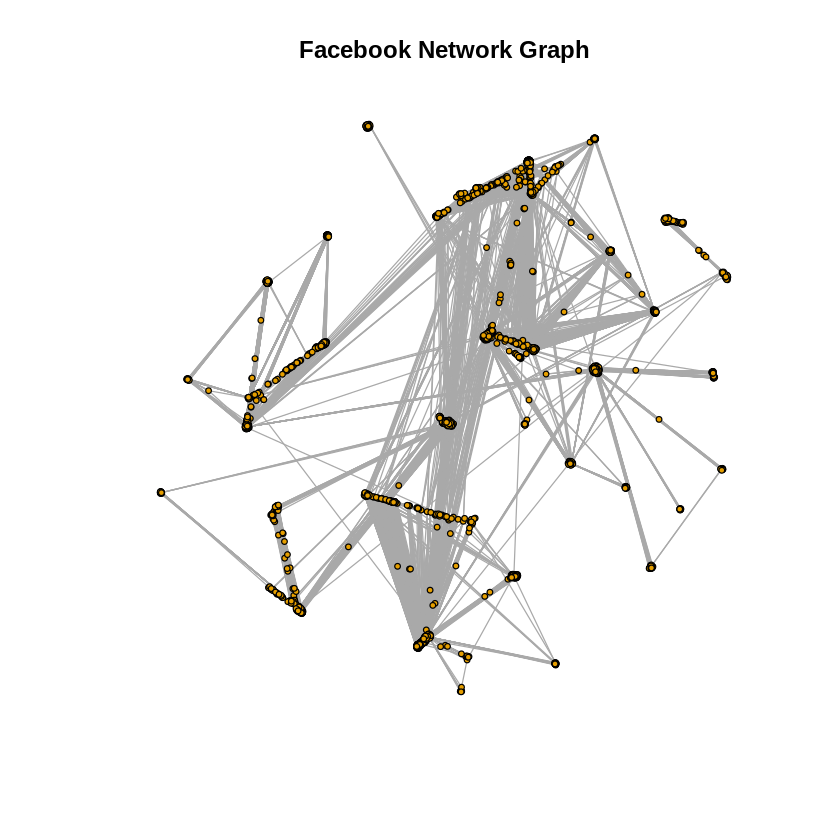

In [ ]:
plot(facebookGraph, vertex.size=2, vertex.label=NA, main="Facebook Network Graph")

In [ ]:
# 1.1
# number of nodes
sprintf("Number of nodes: %i", vcount(facebookGraph))
# number of edge
sprintf("Number of edges: %i", ecount(facebookGraph))

[1] "Number of nodes: 4039"

[1] "Number of edges: 88234"

In [ ]:
# 1.2
# is network connected?
sprintf("Is the graph connected? %i", is_connected(facebookGraph))

# find GCC and report size of GCC

[1] "Is the graph connected? 1"

# Question 2

In [ ]:
# diameter of the graph

In [ ]:
sprintf("Diameter of the graph: %i", diameter(facebookGraph, directed=FALSE))

[1] "Diameter of the graph: 8"

# Question 3

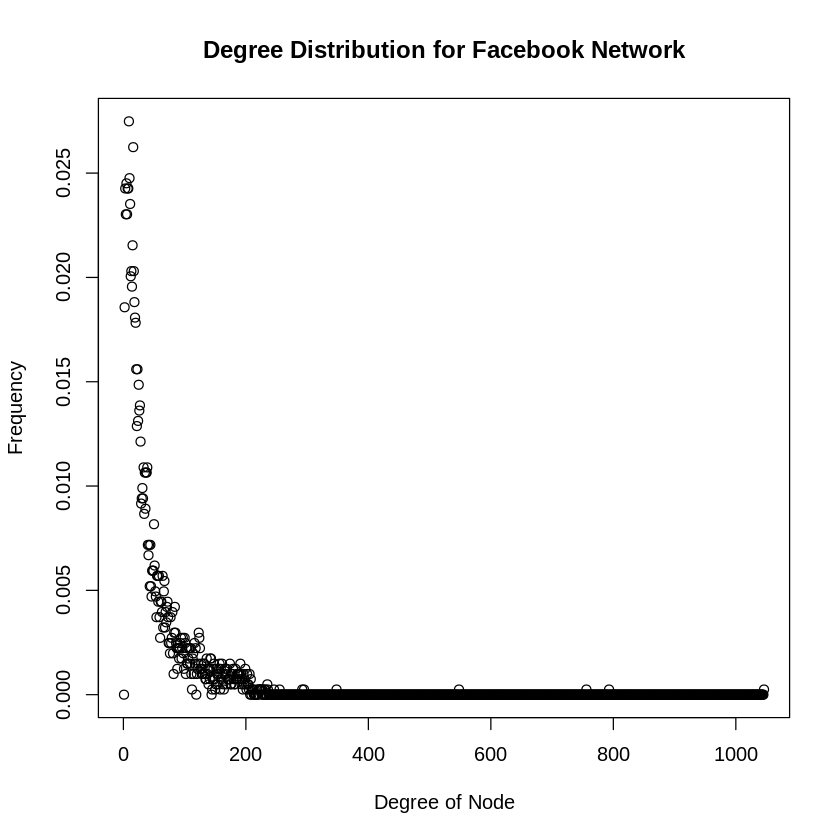

In [ ]:
# plot the degree distribution
plot(degree.distribution(facebookGraph), main="Degree Distribution for Facebook Network", xlab="Degree of Node", ylab="Frequency")

In [ ]:
# report the average degree
sprintf("Average Degree: %f", mean(degree(facebookGraph)))

[1] "Average Degree: 43.691013"

# Question 4

[1] "Slope and Intercept"

Call:
lm(formula = log_dist ~ log_deg)

Coefficients:
(Intercept)      log_deg  
    -0.6611      -1.2475  



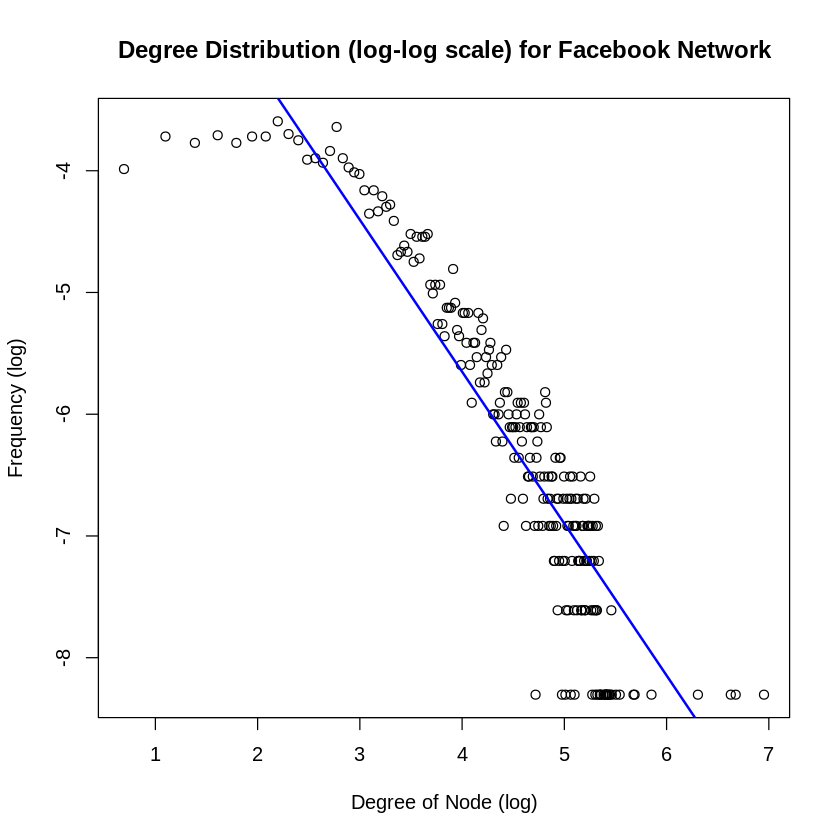

In [ ]:
# plot degree distribution in log-log plot
deg_dist = degree.distribution(facebookGraph)
log_deg <- log(which(deg_dist !=0, arr.ind=TRUE))
log_dist <- log(deg_dist[which(deg_dist !=0)])

plot(log_deg, log_dist, main="Degree Distribution (log-log scale) for Facebook Network", xlab ="Degree of Node (log)", ylab="Frequency (log)")

# fit a line
fit = lm(log_dist ~ log_deg)
abline(fit, col="blue", lwd=2)
# estimate slope of the line
print("Slope and Intercept")
print(fit)

# Question 5

In [ ]:
# create a personalized network of user whose ID is 1
    # personalized graph is v_i and its neighors (order=1)
# node ID = 1 (node ID in edgelist is 0)
selectedNodes <- V(facebookGraph)[1]
networkNeighborhood<-ego(facebookGraph, order=1, nodes=selectedNodes)

In [ ]:
personalizedGraph <-induced_subgraph(facebookGraph, unlist(networkNeighborhood))

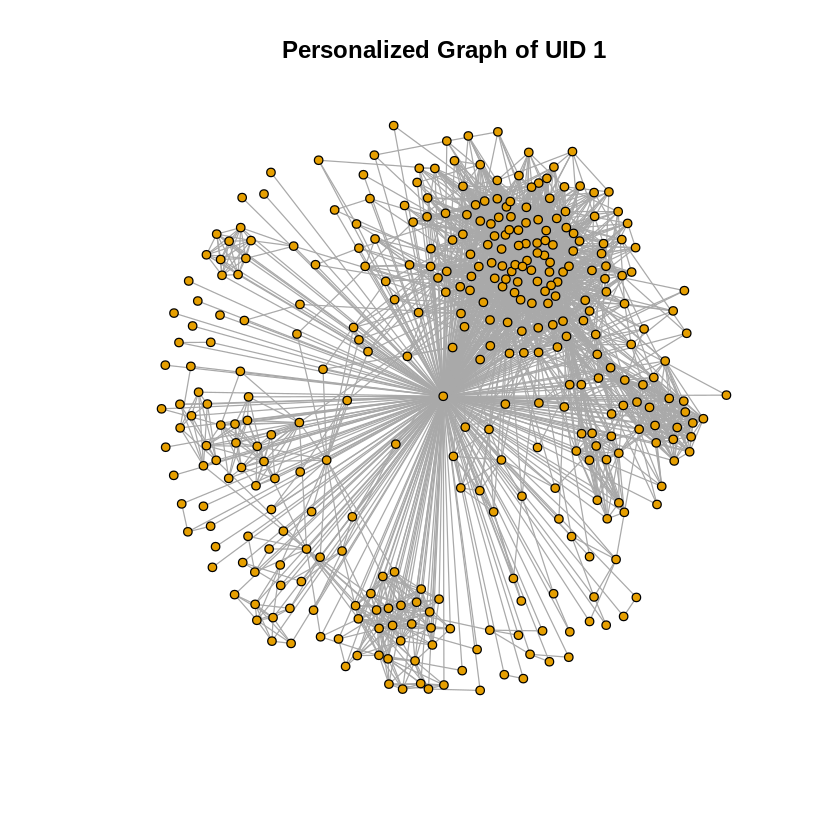

In [ ]:
plot(personalizedGraph, vertex.label=NA, vertex.size=3, main="Personalized Graph of UID 1")

In [ ]:
# number of nodes
sprintf("Number of nodes: %i", vcount(personalizedGraph))
# number of edge
sprintf("Number of edges: %i", ecount(personalizedGraph))

[1] "Number of nodes: 348"

[1] "Number of edges: 2866"

# Question 6

In [ ]:
# diameter of personalized network
sprintf("Diameter of the graph: %i", diameter(personalizedGraph, directed=FALSE))

[1] "Diameter of the graph: 2"

# Question 8

In [ ]:
neighborSize = ego_size(facebookGraph, order=1, nodes=V(facebookGraph))

In [ ]:
# core node: nodes that have more than 200 neighbors
# how many core nodes are there?
coreNodes = which(neighborSize>200+1)
sprintf("Number of core nodes: %i", length(coreNodes))

[1] "Number of core nodes: 40"

In [ ]:
coreNodes

[1]    1  100  288  419  954 1064 1211 1288 1436 1440 1514 1535 1577 1593 1611
[16] 1641 1665 1713 1723 1752 1795 1803 1857 1888 1932 1951 2014 2026 2037 2041
[31] 2048 2074 2154 2216 2268 2310 2344 2360 2405 3156

In [ ]:
# what is the average degree of the core nodes?
averageDegree <-mean(degree(facebookGraph, v=V(facebookGraph)[coreNodes]))
sprintf("Average Degree of Code Nodes: %f", averageDegree)

[1] "Average Degree of Code Nodes: 279.375000"

# Question 9

In [ ]:
# (a) find community structure using the following community detection algorithms...
    # (1) fast-greedy
    # (2) edge-betweenness
    # (3) infomap

# display community structure of core node's personalized networks using colors

# (b) find modularity scores
    # (1) fast-greedy
    # (2) edge-betweenness
    # (3) infomap


In [ ]:
facebookGraph <- read.graph("facebook_combined.txt", format="edgelist", directed=FALSE)

In [ ]:
specCoreNode <- c(1, 108, 349, 484, 1087)
egoGraph <- make_ego_graph(facebookGraph, order=1, nodes=V(facebookGraph)[specCoreNode])

In [ ]:
i=1

personalizedNetwork <- egoGraph[[i]]
print(sprintf("Core node ID: %i", specCoreNode[i]))

# FAST GREEDY
fastGreedy <- cluster_fast_greedy(personalizedNetwork)
modularityFG <- modularity(fastGreedy)
#sprintf("Fast Greedy Modularity: %f", modularityFG)
plot(fastGreedy,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Fast Greedy Community Clustering for core node UID", specCoreNode[i]))

# EDGE BETWEENESS
edgeBetweenness <- cluster_edge_betweenness(personalizedNetwork, directed=FALSE)
modularityEB <- modularity(edgeBetweenness)
#sprintf("Edge Betweenness Modularity: %f", modularityEB)
plot(edgeBetweenness,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Edge Betweenness Community Clustering for core node UID", specCoreNode[i]))

# Cluster Info Map
infoMapCluster <- cluster_infomap(personalizedNetwork)
modularityIM <- modularity(infoMapCluster)
#sprintf("Info Map Modularity: %f", modularityIM)
plot(infoMapCluster,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Info Map Community Clustering for core node UID", specCoreNode[i]))

print(sprintf("Fast Greedy Modularity: %f", modularityFG))
print(sprintf("Edge Betweenness Modularity: %f", modularityEB))
print(sprintf("Info Map Modularity: %f", modularityIM))

[1] "Core node ID: 108"


ERROR: ignored

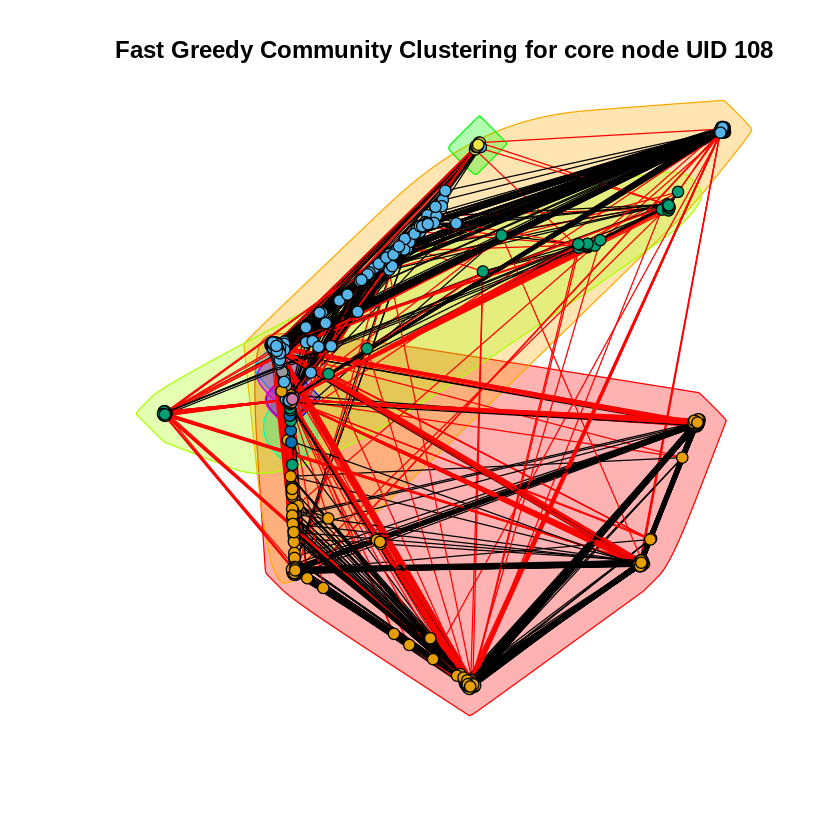

In [ ]:
i=2

personalizedNetwork <- egoGraph[[i]]
print(sprintf("Core node ID: %i", specCoreNode[i]))

# FAST GREEDY
fastGreedy <- cluster_fast_greedy(personalizedNetwork)
modularityFG <- modularity(fastGreedy)
#sprintf("Fast Greedy Modularity: %f", modularityFG)
plot(fastGreedy,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Fast Greedy Community Clustering for core node UID", specCoreNode[i]))

# EDGE BETWEENESS
edgeBetweenness <- cluster_edge_betweenness(personalizedNetwork, directed=FALSE)
modularityEB <- modularity(edgeBetweenness)
#sprintf("Edge Betweenness Modularity: %f", modularityEB)
plot(edgeBetweenness,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Edge Betweenness Community Clustering for core node UID", specCoreNode[i]))

# Cluster Info Map
infoMapCluster <- cluster_infomap(personalizedNetwork)
modularityIM <- modularity(infoMapCluster)
#sprintf("Info Map Modularity: %f", modularityIM)
plot(infoMapCluster,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Info Map Community Clustering for core node UID", specCoreNode[i]))

print(sprintf("Fast Greedy Modularity: %f", modularityFG))
print(sprintf("Edge Betweenness Modularity: %f", modularityEB))
print(sprintf("Info Map Modularity: %f", modularityIM))

In [ ]:
i=2

personalizedNetwork <- egoGraph[[i]]
print(sprintf("Core node ID: %i", specCoreNode[i]))

# EDGE BETWEENESS
edgeBetweenness <- cluster_edge_betweenness(personalizedNetwork, directed=FALSE)
modularityEB <- modularity(edgeBetweenness)
#sprintf("Edge Betweenness Modularity: %f", modularityEB)
plot(edgeBetweenness,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Edge Betweenness Community Clustering for core node UID", specCoreNode[i]))

print(sprintf("Edge Betweenness Modularity: %f", modularityEB))


[1] "Core node ID: 108"


ERROR: ignored

In [ ]:
i=2

personalizedNetwork <- egoGraph[[i]]
print(sprintf("Core node ID: %i", specCoreNode[i]))

# Cluster Info Map
infoMapCluster <- cluster_infomap(personalizedNetwork)
modularityIM <- modularity(infoMapCluster)
#sprintf("Info Map Modularity: %f", modularityIM)
plot(infoMapCluster,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Info Map Community Clustering for core node UID", specCoreNode[i]))

print(sprintf("Info Map Modularity: %f", modularityIM))

[1] "Core node ID: 108"


ERROR: ignored

[1] "Core node ID: 349"


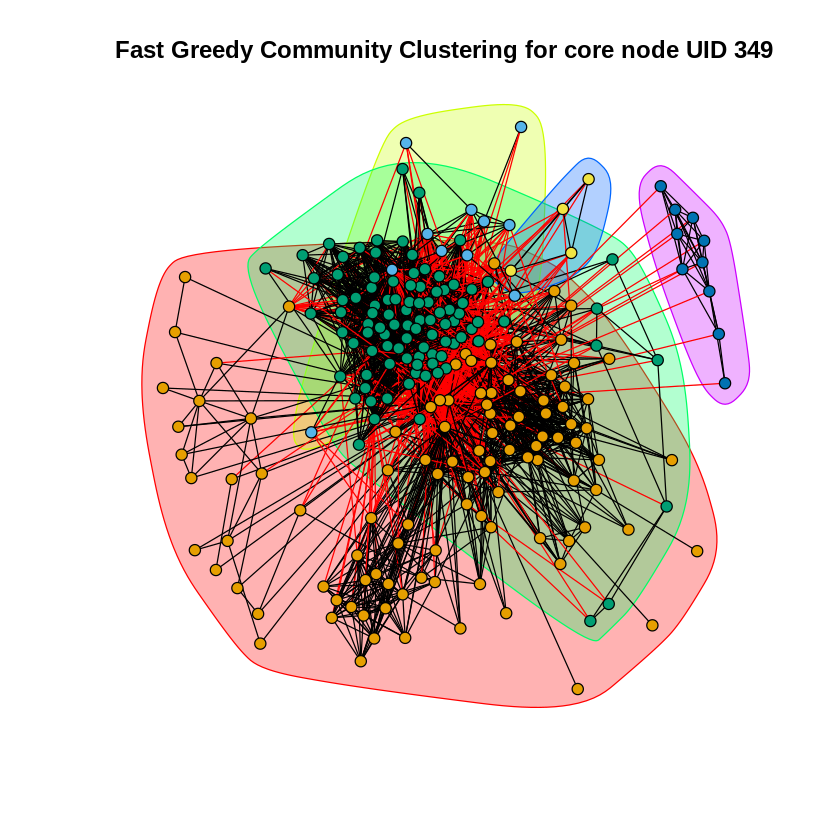

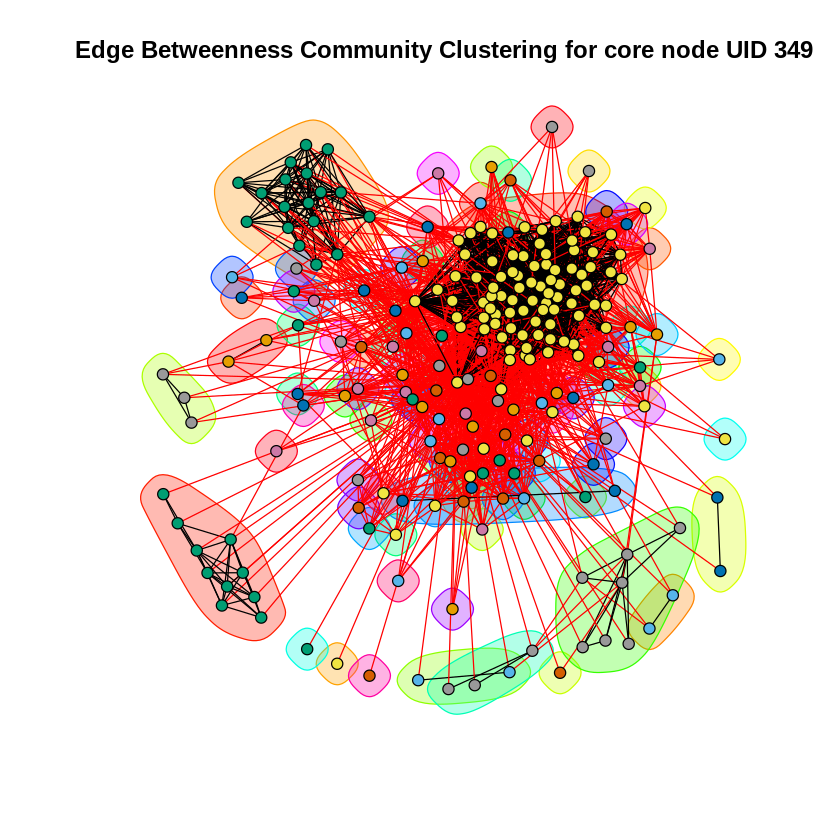

[1] "Fast Greedy Modularity: 0.251715"
[1] "Edge Betweenness Modularity: 0.133528"
[1] "Info Map Modularity: 0.095464"


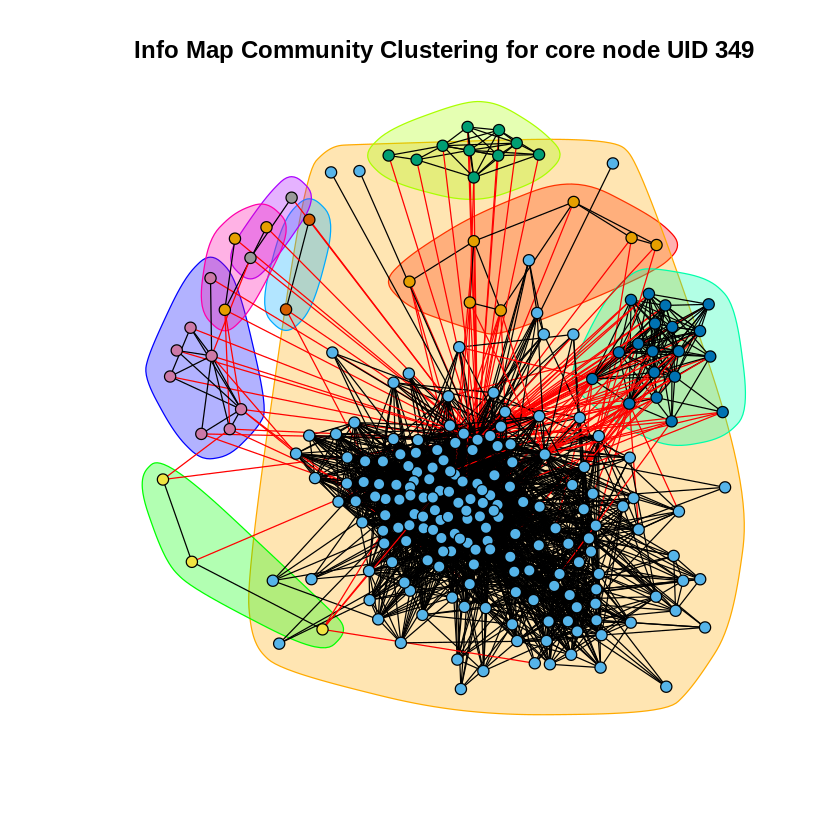

In [ ]:
i=3

personalizedNetwork <- egoGraph[[i]]
print(sprintf("Core node ID: %i", specCoreNode[i]))

# FAST GREEDY
fastGreedy <- cluster_fast_greedy(personalizedNetwork)
modularityFG <- modularity(fastGreedy)
#sprintf("Fast Greedy Modularity: %f", modularityFG)
plot(fastGreedy,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Fast Greedy Community Clustering for core node UID", specCoreNode[i]))

# EDGE BETWEENESS
edgeBetweenness <- cluster_edge_betweenness(personalizedNetwork, directed=FALSE)
modularityEB <- modularity(edgeBetweenness)
#sprintf("Edge Betweenness Modularity: %f", modularityEB)
plot(edgeBetweenness,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Edge Betweenness Community Clustering for core node UID", specCoreNode[i]))

# Cluster Info Map
infoMapCluster <- cluster_infomap(personalizedNetwork)
modularityIM <- modularity(infoMapCluster)
#sprintf("Info Map Modularity: %f", modularityIM)
plot(infoMapCluster,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Info Map Community Clustering for core node UID", specCoreNode[i]))

print(sprintf("Fast Greedy Modularity: %f", modularityFG))
print(sprintf("Edge Betweenness Modularity: %f", modularityEB))
print(sprintf("Info Map Modularity: %f", modularityIM))

[1] "Core node ID: 484"


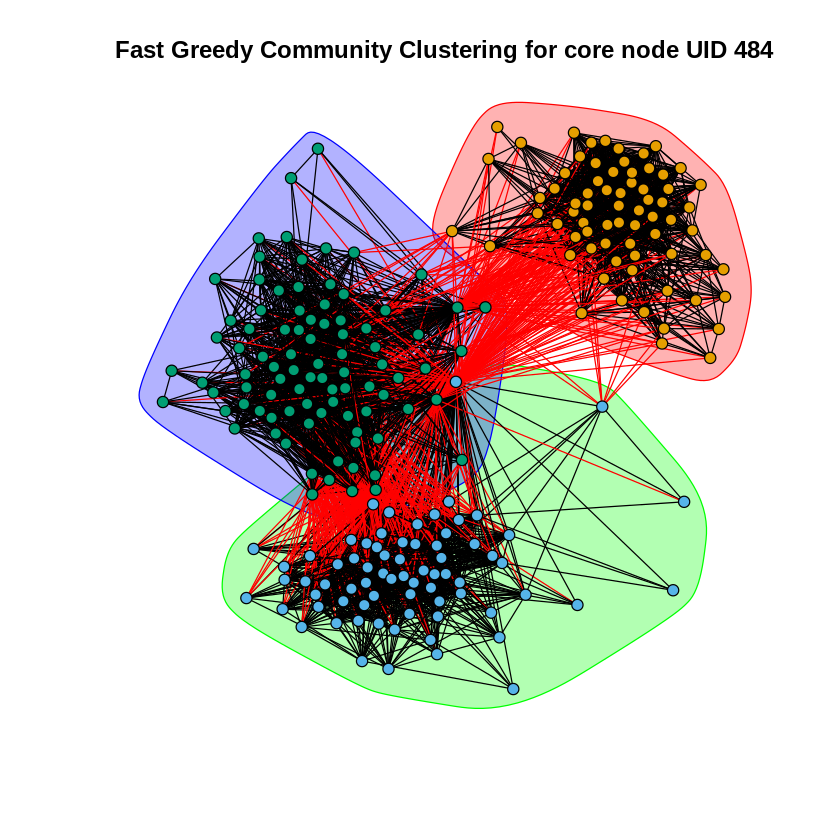

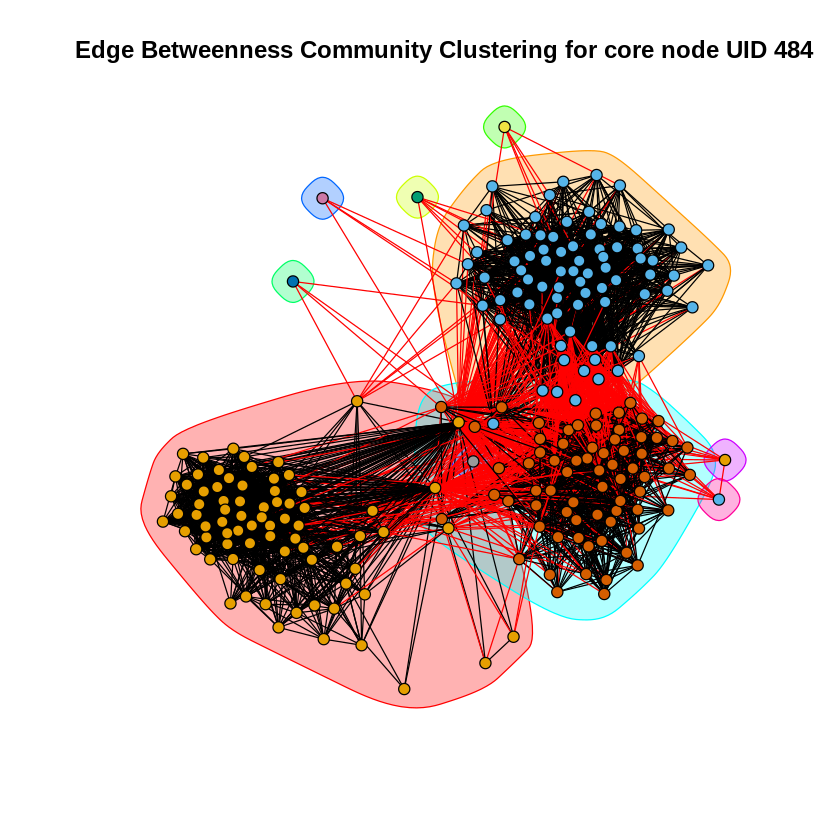

[1] "Fast Greedy Modularity: 0.507002"
[1] "Edge Betweenness Modularity: 0.489095"
[1] "Info Map Modularity: 0.515279"


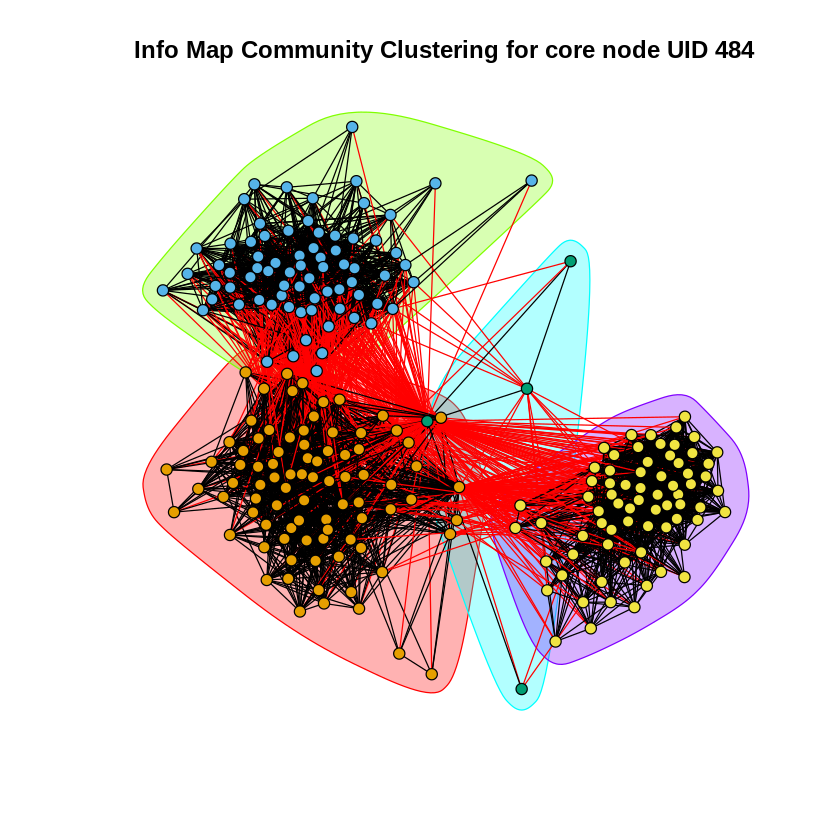

In [ ]:
i=4

personalizedNetwork <- egoGraph[[i]]
print(sprintf("Core node ID: %i", specCoreNode[i]))

# FAST GREEDY
fastGreedy <- cluster_fast_greedy(personalizedNetwork)
modularityFG <- modularity(fastGreedy)
#sprintf("Fast Greedy Modularity: %f", modularityFG)
plot(fastGreedy,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Fast Greedy Community Clustering for core node UID", specCoreNode[i]))

# EDGE BETWEENESS
edgeBetweenness <- cluster_edge_betweenness(personalizedNetwork, directed=FALSE)
modularityEB <- modularity(edgeBetweenness)
#sprintf("Edge Betweenness Modularity: %f", modularityEB)
plot(edgeBetweenness,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Edge Betweenness Community Clustering for core node UID", specCoreNode[i]))

# Cluster Info Map
infoMapCluster <- cluster_infomap(personalizedNetwork)
modularityIM <- modularity(infoMapCluster)
#sprintf("Info Map Modularity: %f", modularityIM)
plot(infoMapCluster,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Info Map Community Clustering for core node UID", specCoreNode[i]))

print(sprintf("Fast Greedy Modularity: %f", modularityFG))
print(sprintf("Edge Betweenness Modularity: %f", modularityEB))
print(sprintf("Info Map Modularity: %f", modularityIM))

[1] "Core node ID: 1087"


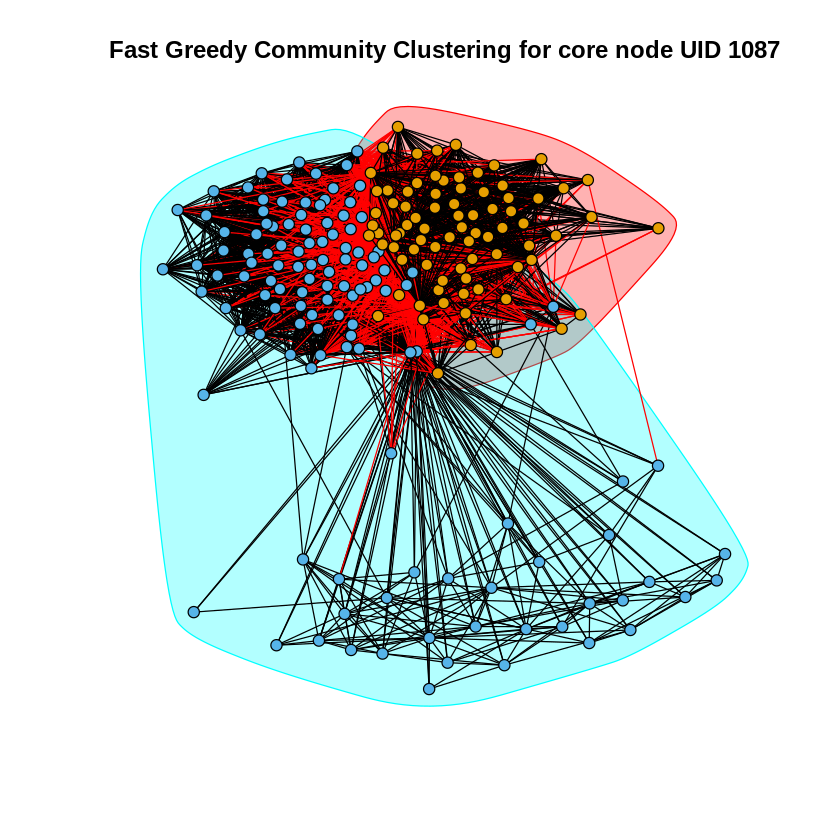

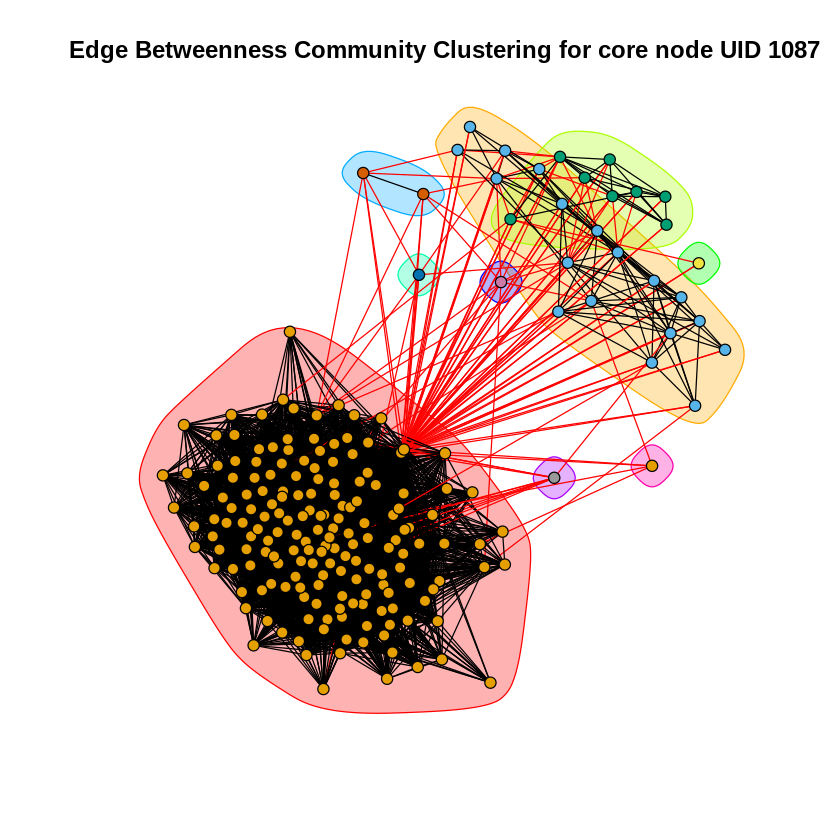

[1] "Fast Greedy Modularity: 0.145531"
[1] "Edge Betweenness Modularity: 0.027624"
[1] "Info Map Modularity: 0.026907"


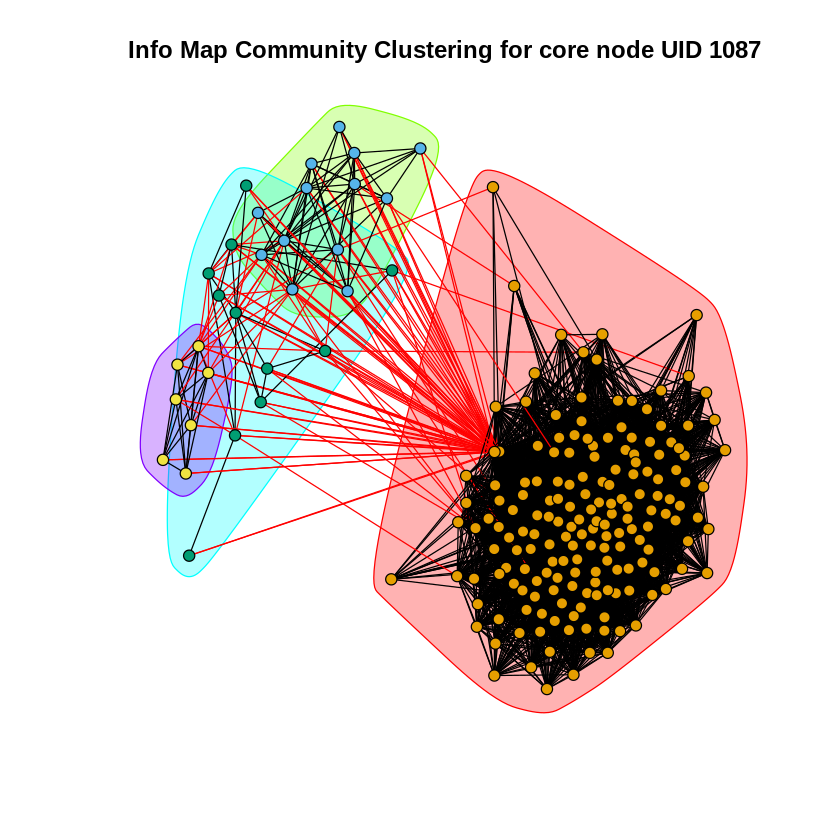

In [ ]:
i=5

personalizedNetwork <- egoGraph[[i]]
print(sprintf("Core node ID: %i", specCoreNode[i]))

# FAST GREEDY
fastGreedy <- cluster_fast_greedy(personalizedNetwork)
modularityFG <- modularity(fastGreedy)
#sprintf("Fast Greedy Modularity: %f", modularityFG)
plot(fastGreedy,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Fast Greedy Community Clustering for core node UID", specCoreNode[i]))

# EDGE BETWEENESS
edgeBetweenness <- cluster_edge_betweenness(personalizedNetwork, directed=FALSE)
modularityEB <- modularity(edgeBetweenness)
#sprintf("Edge Betweenness Modularity: %f", modularityEB)
plot(edgeBetweenness,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Edge Betweenness Community Clustering for core node UID", specCoreNode[i]))

# Cluster Info Map
infoMapCluster <- cluster_infomap(personalizedNetwork)
modularityIM <- modularity(infoMapCluster)
#sprintf("Info Map Modularity: %f", modularityIM)
plot(infoMapCluster,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Info Map Community Clustering for core node UID", specCoreNode[i]))

print(sprintf("Fast Greedy Modularity: %f", modularityFG))
print(sprintf("Edge Betweenness Modularity: %f", modularityEB))
print(sprintf("Info Map Modularity: %f", modularityIM))

[1] "Core node ID: 108"


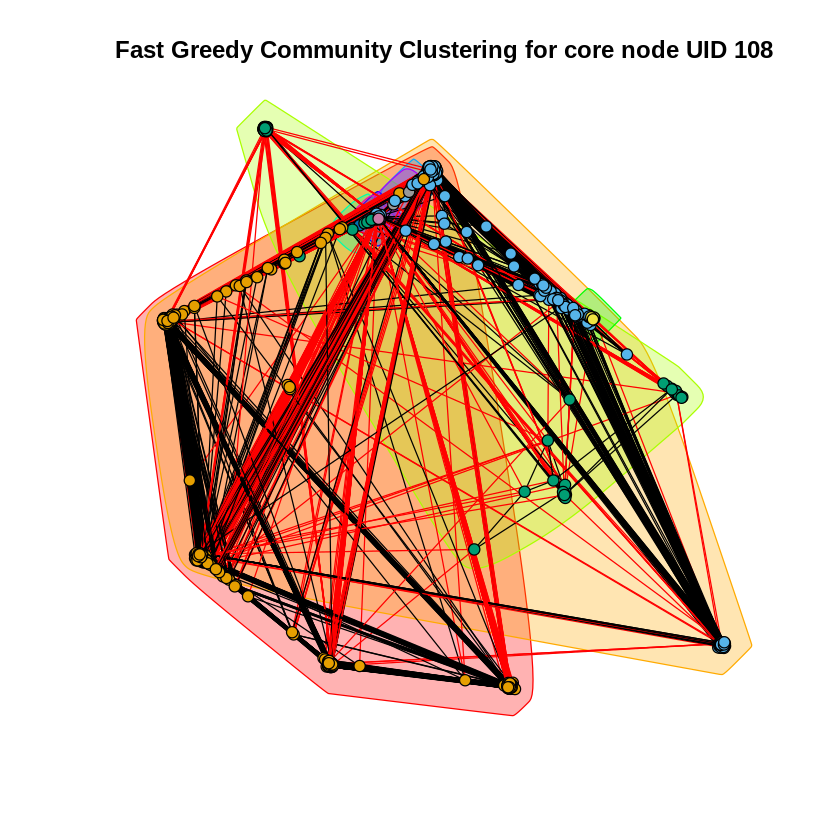

In [ ]:
i=2

personalizedNetwork <- egoGraph[[i]]
print(sprintf("Core node ID: %i", specCoreNode[i]))

# FAST GREEDY
fastGreedy <- cluster_fast_greedy(personalizedNetwork)
modularityFG <- modularity(fastGreedy)
#sprintf("Fast Greedy Modularity: %f", modularityFG)
plot(fastGreedy,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Fast Greedy Community Clustering for core node UID", specCoreNode[i]))


In [ ]:
print(sprintf("Fast Greedy Modularity: %f", modularityFG))

[1] "Fast Greedy Modularity: 0.435929"


In [ ]:

# EDGE BETWEENESS
edgeBetweenness <- cluster_edge_betweenness(personalizedNetwork, directed=FALSE)
modularityEB <- modularity(edgeBetweenness)
#sprintf("Edge Betweenness Modularity: %f", modularityEB)
plot(edgeBetweenness,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Edge Betweenness Community Clustering for core node UID", specCoreNode[i]))


ERROR: ignored

In [ ]:

print(sprintf("Edge Betweenness Modularity: %f", modularityEB))

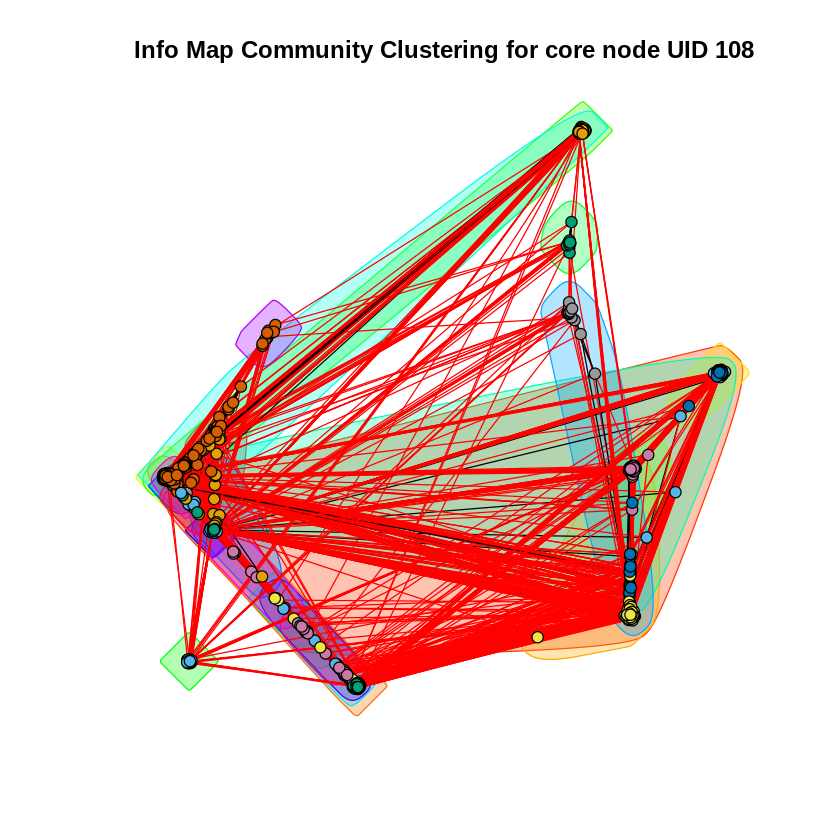

In [ ]:

# Cluster Info Map
infoMapCluster <- cluster_infomap(personalizedNetwork)
modularityIM <- modularity(infoMapCluster)
#sprintf("Info Map Modularity: %f", modularityIM)
plot(infoMapCluster,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Info Map Community Clustering for core node UID", specCoreNode[i]))




In [ ]:
print(sprintf("Info Map Modularity: %f", modularityIM))

[1] "Info Map Modularity: 0.508223"


# Question 10

In [ ]:
facebookGraph <- read.graph("facebook_combined.txt", format="edgelist", directed=FALSE)

In [ ]:
specCoreNode <- c(1, 108, 349, 484, 1087)

[1] "Core node ID: 1"


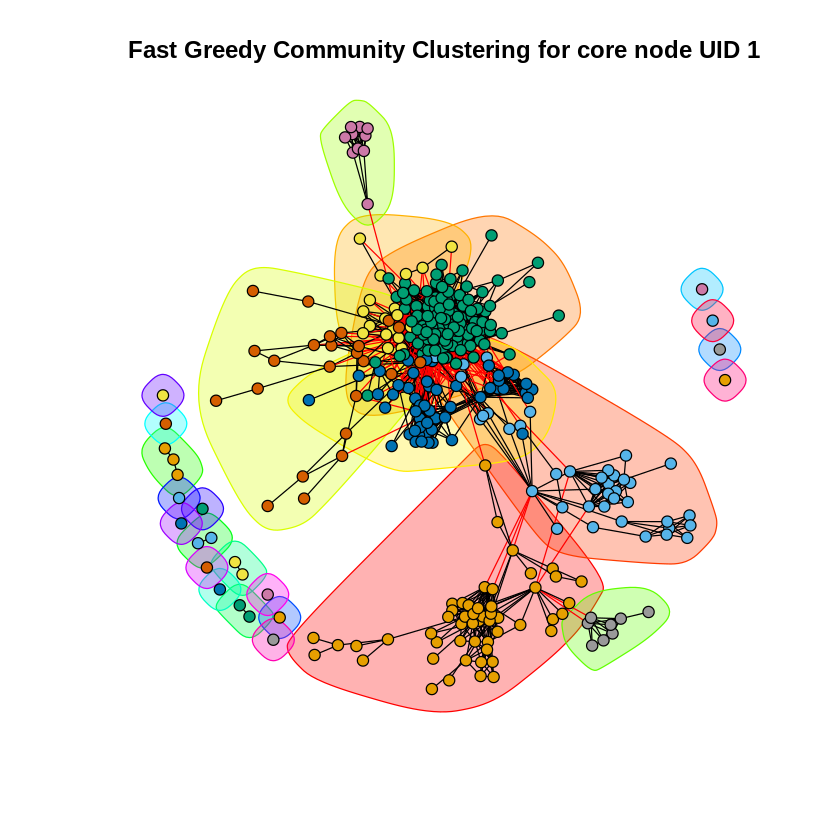

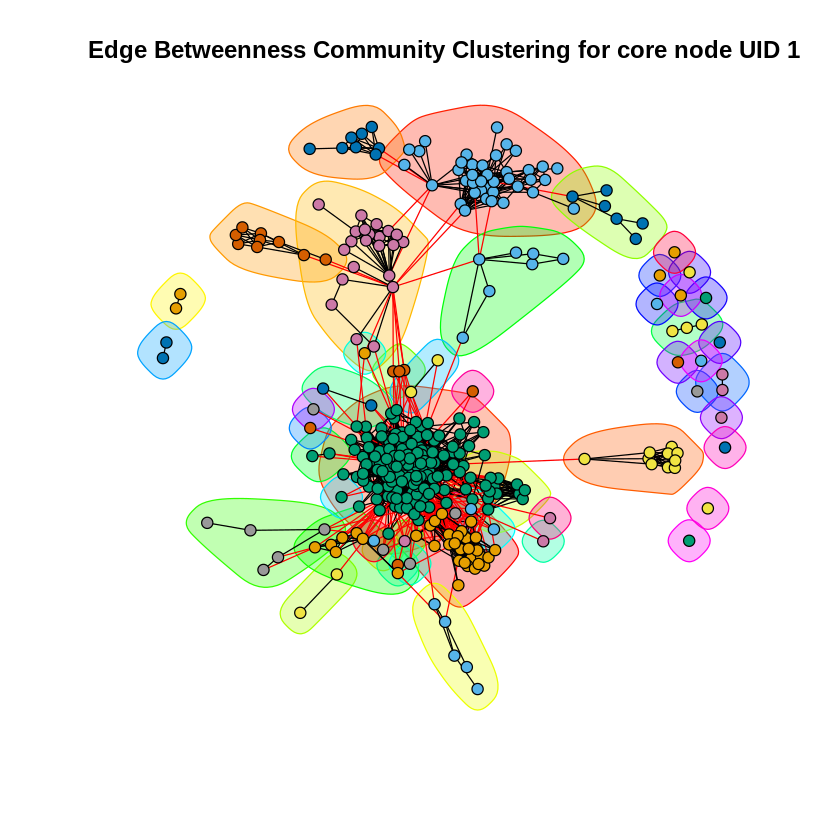

[1] "Fast Greedy Modularity: 0.441853"
[1] "Edge Betweenness Modularity: 0.416146"
[1] "Info Map Modularity: 0.418008"


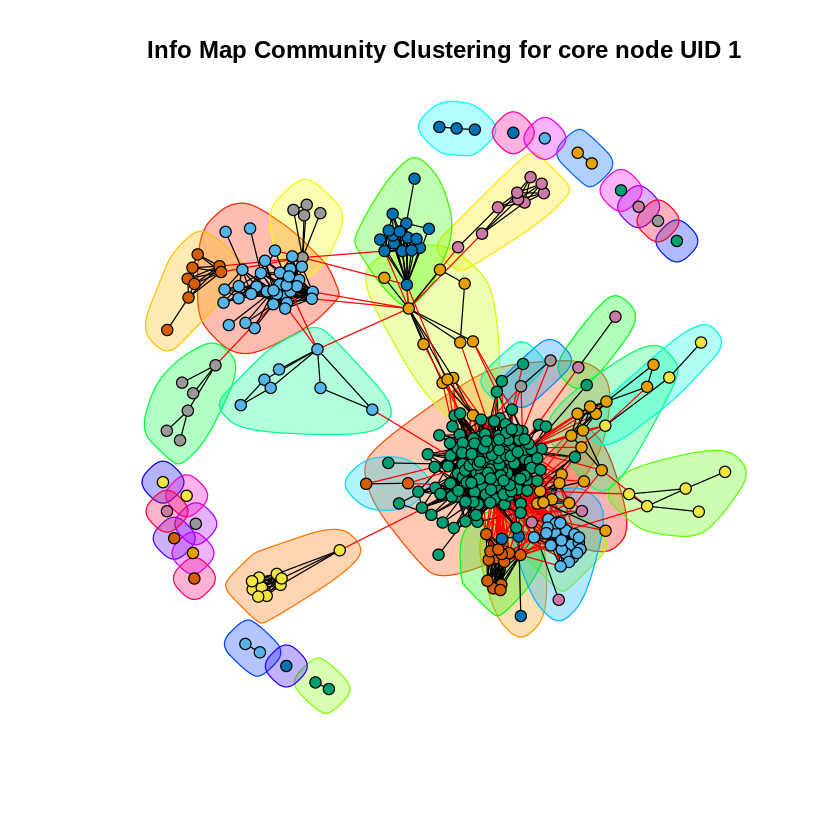

In [ ]:
i=1

personalizedNetwork <- induced_subgraph(facebookGraph, neighbors(facebookGraph, specCoreNode[i])) # graph without core
print(sprintf("Core node ID: %i", specCoreNode[i]))

# FAST GREEDY
fastGreedy <- cluster_fast_greedy(personalizedNetwork)
modularityFG <- modularity(fastGreedy)
#sprintf("Fast Greedy Modularity: %f", modularityFG)
plot(fastGreedy,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Fast Greedy Community Clustering for core node UID", specCoreNode[i]))

# EDGE BETWEENESS
edgeBetweenness <- cluster_edge_betweenness(personalizedNetwork, directed=FALSE)
modularityEB <- modularity(edgeBetweenness)
#sprintf("Edge Betweenness Modularity: %f", modularityEB)
plot(edgeBetweenness,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Edge Betweenness Community Clustering for core node UID", specCoreNode[i]))

# Cluster Info Map
infoMapCluster <- cluster_infomap(personalizedNetwork)
modularityIM <- modularity(infoMapCluster)
#sprintf("Info Map Modularity: %f", modularityIM)
plot(infoMapCluster,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Info Map Community Clustering for core node UID", specCoreNode[i]))

print(sprintf("Fast Greedy Modularity: %f", modularityFG))
print(sprintf("Edge Betweenness Modularity: %f", modularityEB))

print(sprintf("Info Map Modularity: %f", modularityIM))

In [ ]:
facebookGraph <- read.graph("facebook_combined.txt", format="edgelist", directed=FALSE)

[1] "Core node ID: 108"


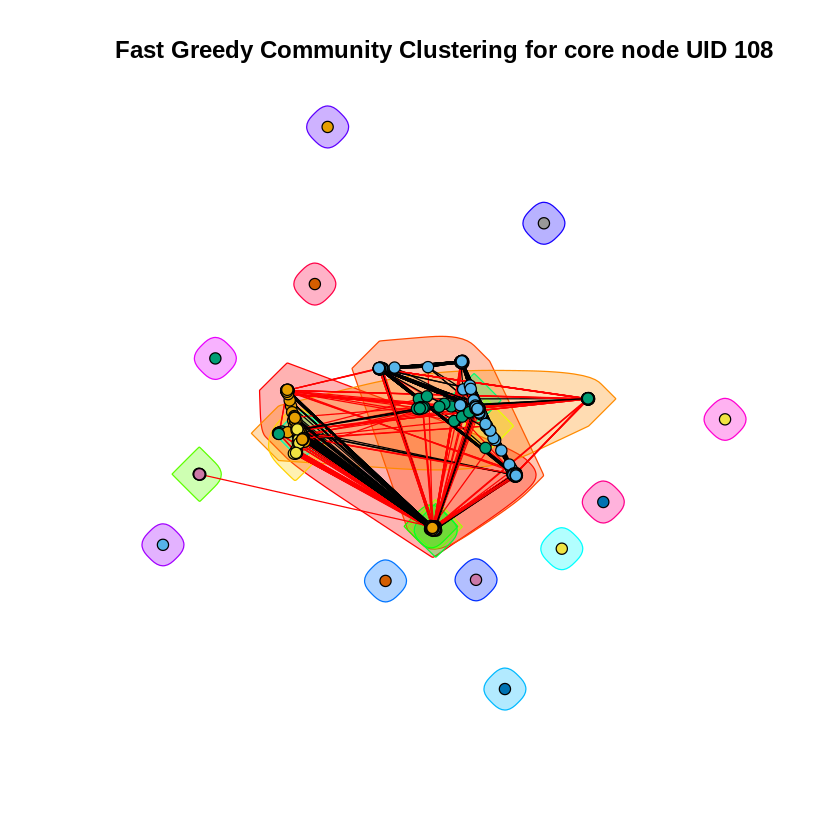

In [ ]:
i=2

personalizedNetwork <- induced_subgraph(facebookGraph, neighbors(facebookGraph, specCoreNode[i])) # graph without core
print(sprintf("Core node ID: %i", specCoreNode[i]))

# FAST GREEDY
fastGreedy <- cluster_fast_greedy(personalizedNetwork)
modularityFG <- modularity(fastGreedy)
#sprintf("Fast Greedy Modularity: %f", modularityFG)
plot(fastGreedy,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Fast Greedy Community Clustering for core node UID", specCoreNode[i]))


In [ ]:
print(sprintf("Fast Greedy Modularity: %f", modularityFG))

[1] "Fast Greedy Modularity: 0.458127"


In [ ]:

# EDGE BETWEENESS
edgeBetweenness <- cluster_edge_betweenness(personalizedNetwork, directed=FALSE)
modularityEB <- modularity(edgeBetweenness)
#sprintf("Edge Betweenness Modularity: %f", modularityEB)
plot(edgeBetweenness,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Edge Betweenness Community Clustering for core node UID", specCoreNode[i]))


ERROR: ignored

In [ ]:

print(sprintf("Edge Betweenness Modularity: %f", modularityEB))

In [ ]:

# Cluster Info Map
infoMapCluster <- cluster_infomap(personalizedNetwork)
modularityIM <- modularity(infoMapCluster)
#sprintf("Info Map Modularity: %f", modularityIM)
plot(infoMapCluster,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Info Map Community Clustering for core node UID", specCoreNode[i]))



In [ ]:


print(sprintf("Info Map Modularity: %f", modularityIM))

In [ ]:
i=3

personalizedNetwork <- induced_subgraph(facebookGraph, neighbors(facebookGraph, specCoreNode[i])) # graph without core
print(sprintf("Core node ID: %i", specCoreNode[i]))

# FAST GREEDY
fastGreedy <- cluster_fast_greedy(personalizedNetwork)
modularityFG <- modularity(fastGreedy)
#sprintf("Fast Greedy Modularity: %f", modularityFG)
plot(fastGreedy,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Fast Greedy Community Clustering for core node UID", specCoreNode[i]))

# EDGE BETWEENESS
edgeBetweenness <- cluster_edge_betweenness(personalizedNetwork, directed=FALSE)
modularityEB <- modularity(edgeBetweenness)
#sprintf("Edge Betweenness Modularity: %f", modularityEB)
plot(edgeBetweenness,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Edge Betweenness Community Clustering for core node UID", specCoreNode[i]))

# Cluster Info Map
infoMapCluster <- cluster_infomap(personalizedNetwork)
modularityIM <- modularity(infoMapCluster)
#sprintf("Info Map Modularity: %f", modularityIM)
plot(infoMapCluster,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Info Map Community Clustering for core node UID", specCoreNode[i]))

print(sprintf("Fast Greedy Modularity: %f", modularityFG))
print(sprintf("Edge Betweenness Modularity: %f", modularityEB))

print(sprintf("Info Map Modularity: %f", modularityIM))

[1] "Core node ID: 484"


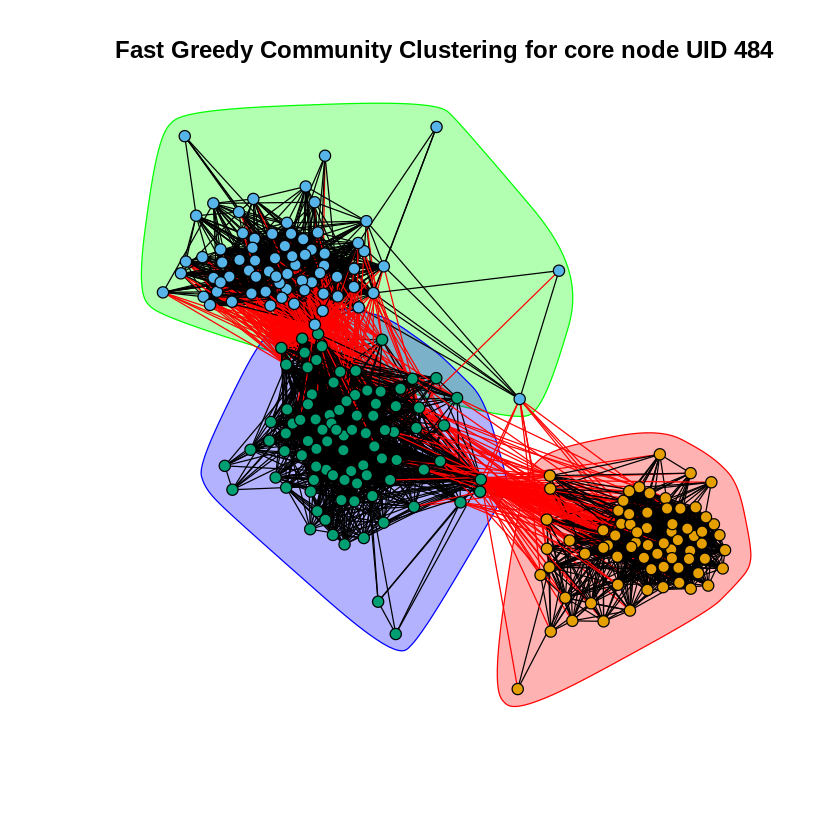

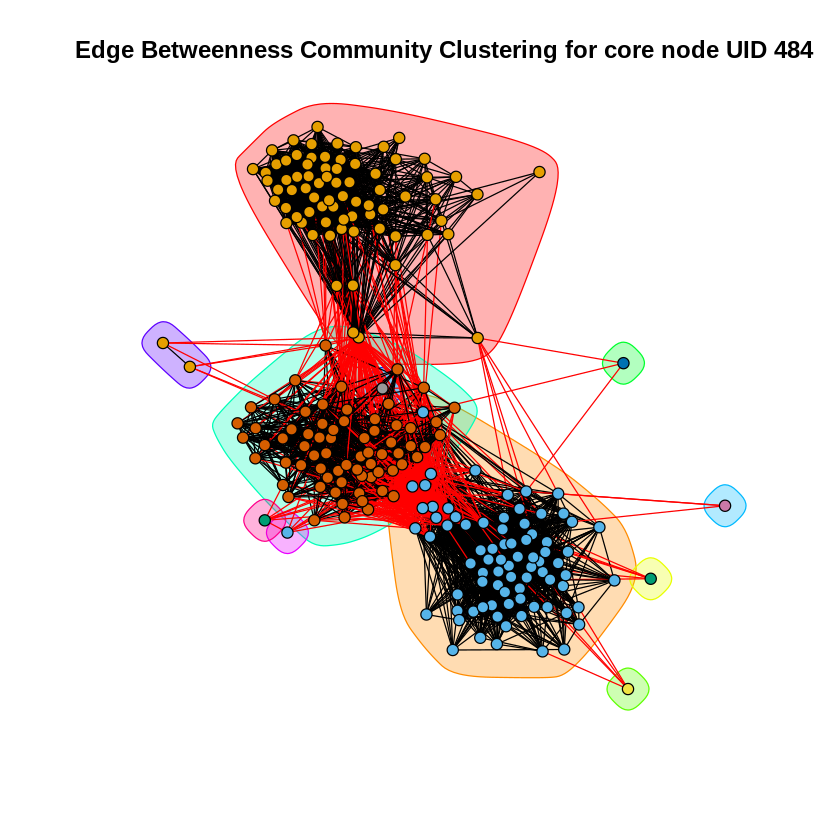

[1] "Fast Greedy Modularity: 0.534214"
[1] "Edge Betweenness Modularity: 0.515441"
[1] "Info Map Modularity: 0.543444"


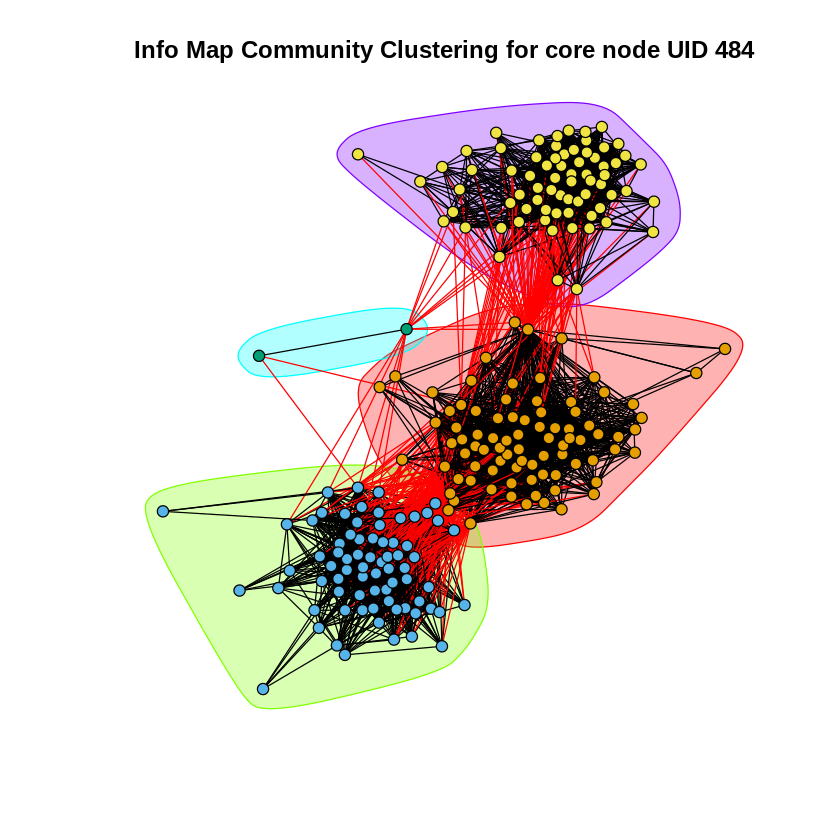

In [ ]:
i=4

personalizedNetwork <- induced_subgraph(facebookGraph, neighbors(facebookGraph, specCoreNode[i])) # graph without core
print(sprintf("Core node ID: %i", specCoreNode[i]))

# FAST GREEDY
fastGreedy <- cluster_fast_greedy(personalizedNetwork)
modularityFG <- modularity(fastGreedy)
#sprintf("Fast Greedy Modularity: %f", modularityFG)
plot(fastGreedy,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Fast Greedy Community Clustering for core node UID", specCoreNode[i]))

# EDGE BETWEENESS
edgeBetweenness <- cluster_edge_betweenness(personalizedNetwork, directed=FALSE)
modularityEB <- modularity(edgeBetweenness)
#sprintf("Edge Betweenness Modularity: %f", modularityEB)
plot(edgeBetweenness,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Edge Betweenness Community Clustering for core node UID", specCoreNode[i]))

# Cluster Info Map
infoMapCluster <- cluster_infomap(personalizedNetwork)
modularityIM <- modularity(infoMapCluster)
#sprintf("Info Map Modularity: %f", modularityIM)
plot(infoMapCluster,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Info Map Community Clustering for core node UID", specCoreNode[i]))

print(sprintf("Fast Greedy Modularity: %f", modularityFG))
print(sprintf("Edge Betweenness Modularity: %f", modularityEB))

print(sprintf("Info Map Modularity: %f", modularityIM))

[1] "Core node ID: 1087"


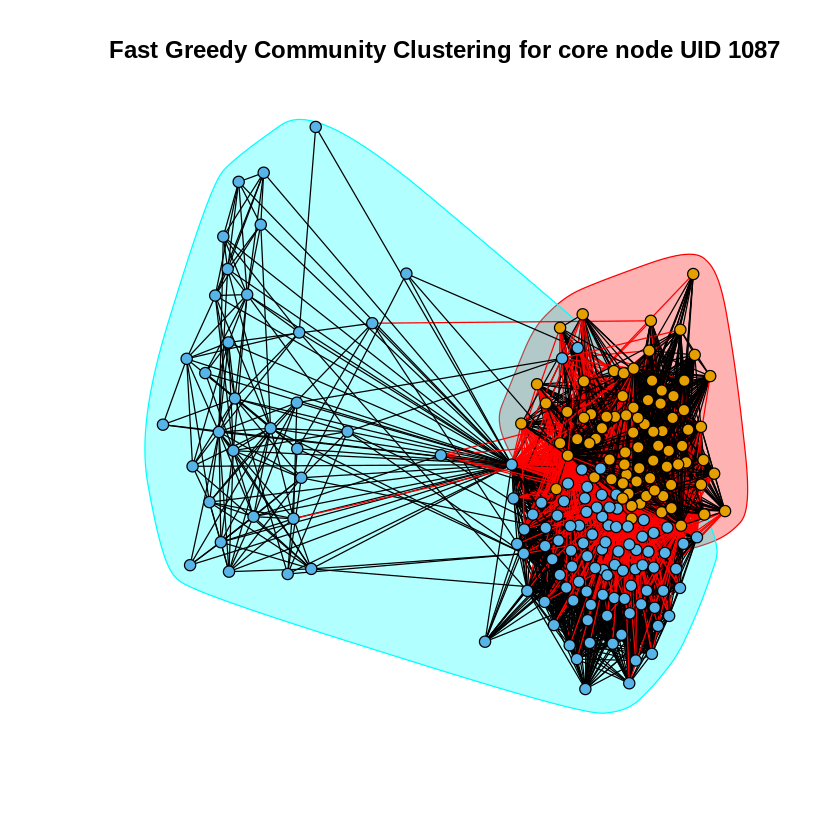

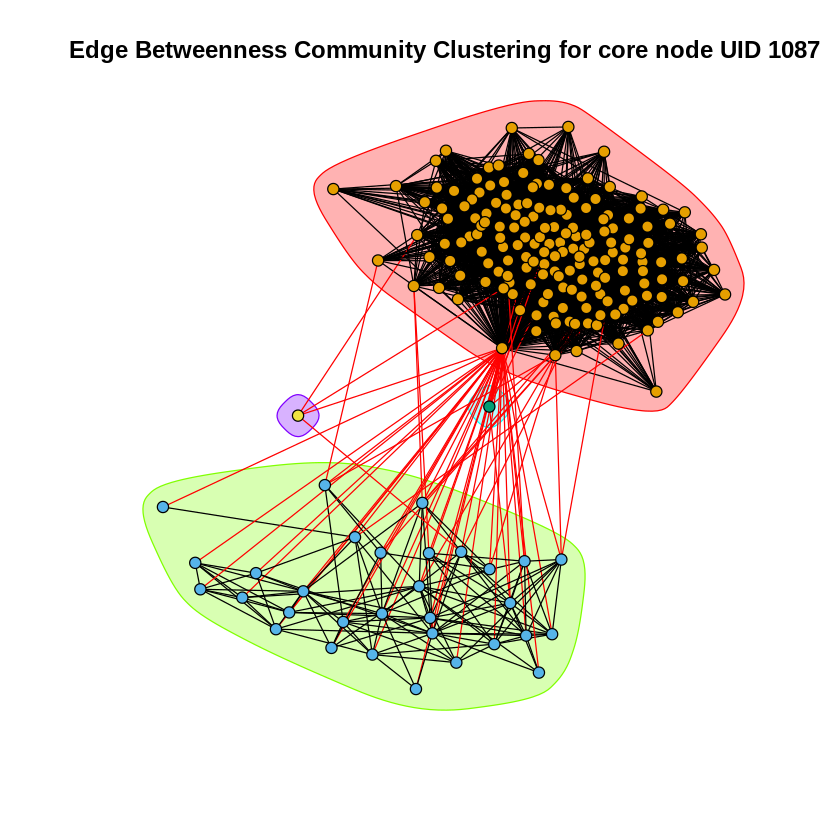

[1] "Fast Greedy Modularity: 0.148196"
[1] "Edge Betweenness Modularity: 0.032495"
[1] "Info Map Modularity: 0.027372"


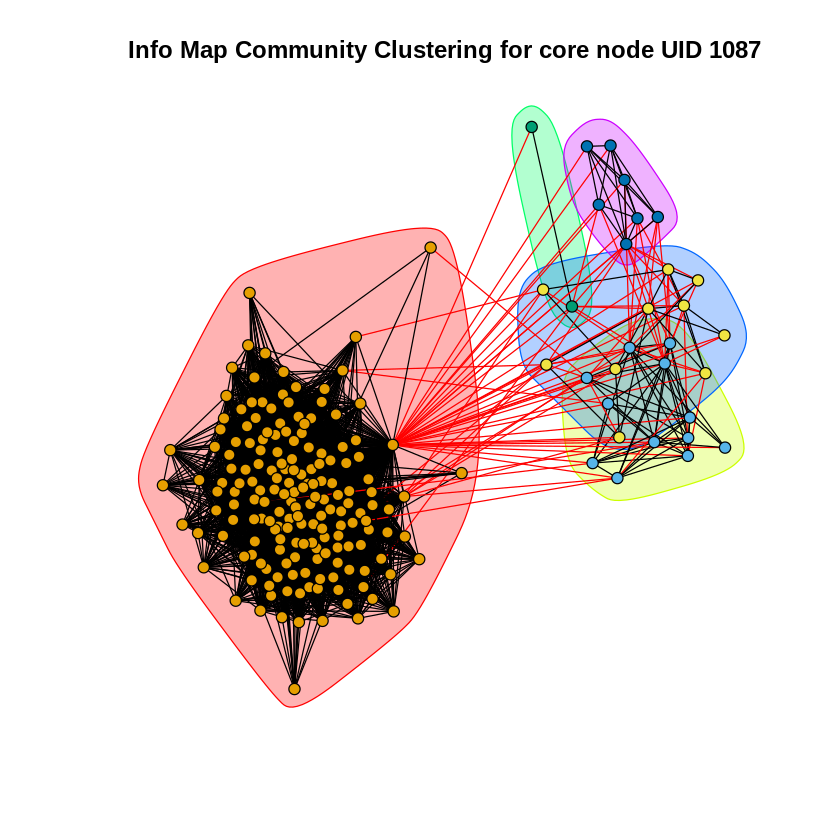

In [ ]:
i=5

personalizedNetwork <- induced_subgraph(facebookGraph, neighbors(facebookGraph, specCoreNode[i])) # graph without core
print(sprintf("Core node ID: %i", specCoreNode[i]))

# FAST GREEDY
fastGreedy <- cluster_fast_greedy(personalizedNetwork)
modularityFG <- modularity(fastGreedy)
#sprintf("Fast Greedy Modularity: %f", modularityFG)
plot(fastGreedy,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Fast Greedy Community Clustering for core node UID", specCoreNode[i]))

# EDGE BETWEENESS
edgeBetweenness <- cluster_edge_betweenness(personalizedNetwork, directed=FALSE)
modularityEB <- modularity(edgeBetweenness)
#sprintf("Edge Betweenness Modularity: %f", modularityEB)
plot(edgeBetweenness,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Edge Betweenness Community Clustering for core node UID", specCoreNode[i]))

# Cluster Info Map
infoMapCluster <- cluster_infomap(personalizedNetwork)
modularityIM <- modularity(infoMapCluster)
#sprintf("Info Map Modularity: %f", modularityIM)
plot(infoMapCluster,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Info Map Community Clustering for core node UID", specCoreNode[i]))

print(sprintf("Fast Greedy Modularity: %f", modularityFG))
print(sprintf("Edge Betweenness Modularity: %f", modularityEB))

print(sprintf("Info Map Modularity: %f", modularityIM))

[1] "Core node ID: 108"


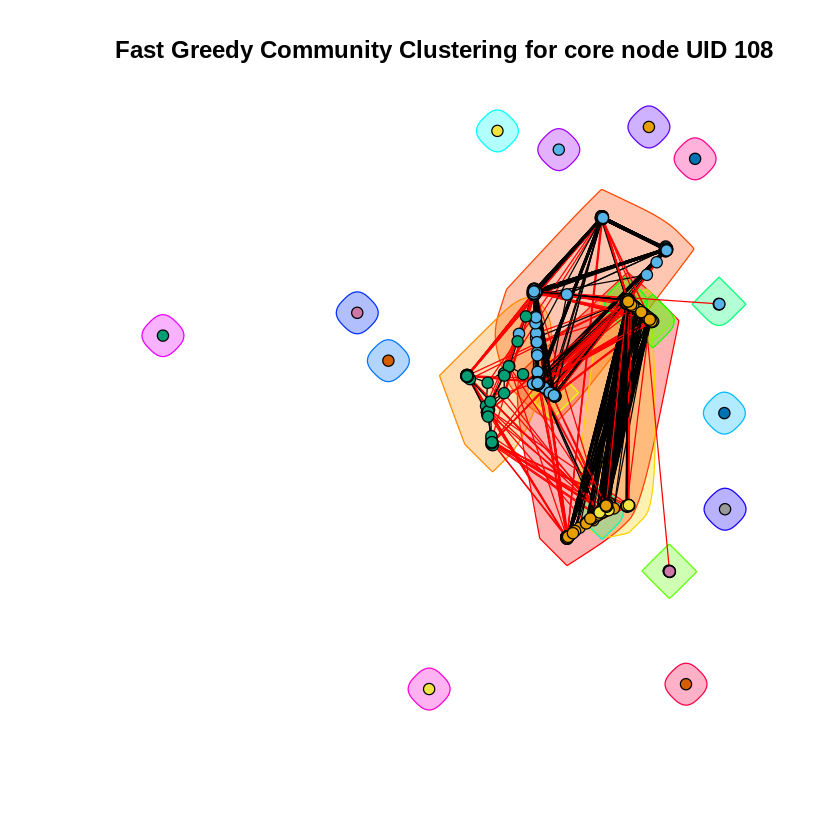

In [ ]:
i=2

personalizedNetwork <- induced_subgraph(facebookGraph, neighbors(facebookGraph, specCoreNode[i])) # graph without core
print(sprintf("Core node ID: %i", specCoreNode[i]))

# FAST GREEDY
fastGreedy <- cluster_fast_greedy(personalizedNetwork)
modularityFG <- modularity(fastGreedy)
#sprintf("Fast Greedy Modularity: %f", modularityFG)
plot(fastGreedy,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Fast Greedy Community Clustering for core node UID", specCoreNode[i]))


In [ ]:
print(sprintf("Fast Greedy Modularity: %f", modularityFG))

[1] "Fast Greedy Modularity: 0.458127"


In [ ]:
# EDGE BETWEENESS
edgeBetweenness <- cluster_edge_betweenness(personalizedNetwork, directed=FALSE)
modularityEB <- modularity(edgeBetweenness)
#sprintf("Edge Betweenness Modularity: %f", modularityEB)
plot(edgeBetweenness,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Edge Betweenness Community Clustering for core node UID", specCoreNode[i]))


ERROR: ignored

In [ ]:
print(sprintf("Edge Betweenness Modularity: %f", modularityEB))


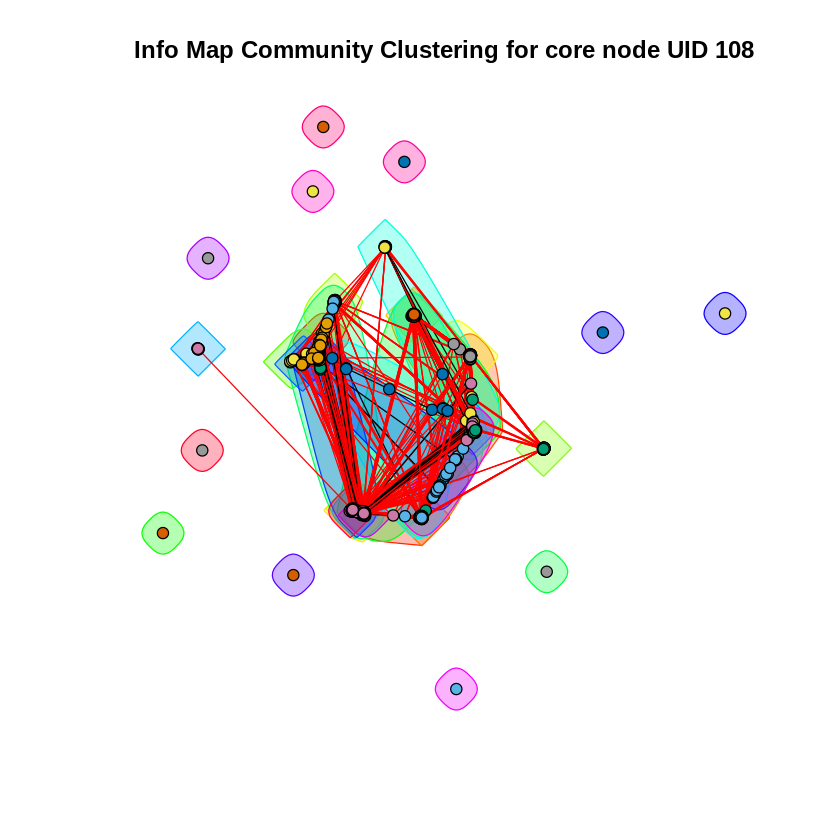

In [ ]:
# Cluster Info Map
infoMapCluster <- cluster_infomap(personalizedNetwork)
modularityIM <- modularity(infoMapCluster)
#sprintf("Info Map Modularity: %f", modularityIM)
plot(infoMapCluster,personalizedNetwork, vertex.size = 4,vertex.label = NA, main=paste("Info Map Community Clustering for core node UID", specCoreNode[i]))



In [ ]:
print(sprintf("Info Map Modularity: %f", modularityIM))

[1] "Info Map Modularity: 0.520181"
